In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
%matplotlib inline

In [2]:
import os

In [3]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [4]:
df= pd.read_csv('IMDb movies.csv')
ratings = pd.read_csv('IMDb ratings.csv', index_col='imdb_title_id')

C:\Users\EXECUTOR2\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [5]:
df.head()

,imdb_title_id,title,original_title,year,date_published,genre,duration,country,language,director,...,actors,description,avg_vote,votes,budget,usa_gross_income,worlwide_gross_income,metascore,reviews_from_users,reviews_from_critics
0,tt0000009,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,None,Alexander Black,...,"Blanche Bayliss, William Courtenay, Chauncey D...",The adventures of a female reporter in the 1890s.,5.9,154,NaN,NaN,NaN,NaN,1.0,2.0
1,tt0000574,The Story of the Kelly Gang,The Story of the Kelly Gang,1906,1906-12-26,"Biography, Crime, Drama",70,Australia,None,Charles Tait,...,"Elizabeth Tait, John Tait, Norman Campbell, Be...",True story of notorious Australian outlaw Ned ...,6.1,589,$ 2250,NaN,NaN,NaN,7.0,7.0
2,tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,...,"Asta Nielsen, Valdemar Psilander, Gunnar Helse...",Two men of high rank are both wooing the beaut...,5.8,188,NaN,NaN,NaN,NaN,5.0,2.0
3,tt0002101,Cleopatra,Cleopatra,1912,1912-11-13,"Drama, History",100,USA,English,Charles L. Gaskill,...,"Helen Gardner, Pearl Sindelar, Miss Fielding, ...",The fabled queen of Egypt's affair with Roman ...,5.2,446,$ 45000,NaN,NaN,NaN,25.0,3.0
4,tt0002130,L'Inferno,L'Inferno,1911,1911-03-06,"Adventure, Drama, Fantasy",68,Italy,Italian,"Francesco Bertolini, Adolfo Padovan",...,"Salvatore Papa, Arturo Pirovano, Giuseppe de L...",Loosely adapted from Dante's Divine Comedy and...,7.0,2237,NaN,NaN,NaN,NaN,31.0,14.0


In [6]:
ratings.head()

,weighted_average_vote,total_votes,mean_vote,median_vote,votes_10,votes_9,votes_8,votes_7,votes_6,votes_5,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0000009,5.9,154,5.9,6.0,12,4,10,43,28,28,...,5.7,13.0,4.5,4.0,5.7,34.0,6.4,51.0,6.0,70.0
tt0000574,6.1,589,6.3,6.0,57,18,58,137,139,103,...,6.2,23.0,6.6,14.0,6.4,66.0,6.0,96.0,6.2,331.0
tt0001892,5.8,188,6.0,6.0,6,6,17,44,52,32,...,5.8,4.0,6.8,7.0,5.4,32.0,6.2,31.0,5.9,123.0
tt0002101,5.2,446,5.3,5.0,15,8,16,62,98,117,...,5.5,14.0,6.1,21.0,4.9,57.0,5.5,207.0,4.7,105.0
tt0002130,7.0,2237,6.9,7.0,210,225,436,641,344,169,...,7.3,82.0,7.4,77.0,6.9,139.0,7.0,488.0,7.0,1166.0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85855 entries, 0 to 85854
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   imdb_title_id          85855 non-null  object 
 1   title                  85855 non-null  object 
 2   original_title         85855 non-null  object 
 3   year                   85855 non-null  object 
 4   date_published         85855 non-null  object 
 5   genre                  85855 non-null  object 
 6   duration               85855 non-null  int64  
 7   country                85791 non-null  object 
 8   language               85022 non-null  object 
 9   director               85768 non-null  object 
 10  writer                 84283 non-null  object 
 11  production_company     81400 non-null  object 
 12  actors                 85786 non-null  object 
 13  description            83740 non-null  object 
 14  avg_vote               85855 non-null  float64
 15  vo

In [8]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 85855 entries, tt0000009 to tt9914942
Data columns (total 48 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   weighted_average_vote      85855 non-null  float64
 1   total_votes                85855 non-null  int64  
 2   mean_vote                  85855 non-null  float64
 3   median_vote                85855 non-null  float64
 4   votes_10                   85855 non-null  int64  
 5   votes_9                    85855 non-null  int64  
 6   votes_8                    85855 non-null  int64  
 7   votes_7                    85855 non-null  int64  
 8   votes_6                    85855 non-null  int64  
 9   votes_5                    85855 non-null  int64  
 10  votes_4                    85855 non-null  int64  
 11  votes_3                    85855 non-null  int64  
 12  votes_2                    85855 non-null  int64  
 13  votes_1                    85855 non-nu

In [9]:
df.describe()

,duration,avg_vote,votes,metascore,reviews_from_users,reviews_from_critics
count,85855.000000,85855.000000,8.585500e+04,13305.000000,78258.000000,74058.000000
mean,100.351418,5.898656,9.493490e+03,55.896881,46.040826,27.479989
std,22.553848,1.234987,5.357436e+04,17.784874,178.511411,58.339158
min,41.000000,1.000000,9.900000e+01,1.000000,1.000000,1.000000
25%,88.000000,5.200000,2.050000e+02,43.000000,4.000000,3.000000
50%,96.000000,6.100000,4.840000e+02,57.000000,9.000000,8.000000
75%,108.000000,6.800000,1.766500e+03,69.000000,27.000000,23.000000
max,808.000000,9.900000,2.278845e+06,100.000000,10472.000000,999.000000


In [10]:
ratings.describe()

,weighted_average_vote,total_votes,mean_vote,median_vote,votes_10,votes_9,votes_8,votes_7,votes_6,votes_5,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
count,85855.000000,8.585500e+04,85855.000000,85855.000000,8.585500e+04,85855.000000,85855.000000,85855.000000,85855.000000,85855.000000,...,84911.000000,84911.000000,83057.000000,83057.000000,85176.000000,85176.000000,85646.000000,85646.000000,85854.000000,85854.000000
mean,5.898656,9.493490e+03,6.226342,6.267853,1.216158e+03,1196.774608,2040.896337,2105.668371,1353.192802,700.291177,...,6.071223,685.655451,6.022226,196.065341,5.155706,76.110231,5.925910,1647.822537,5.749638,4332.940865
std,1.234987,5.357436e+04,1.155280,1.481168,1.245582e+04,11735.363316,13801.122865,10699.375191,5976.801303,2931.301270,...,1.454370,3732.376186,1.541895,842.979585,1.290920,124.264020,1.308087,8455.978158,1.285570,23243.807279
min,1.000000,9.900000e+01,1.000000,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,5.200000,2.050000e+02,5.600000,6.000000,2.100000e+01,8.000000,18.000000,28.000000,30.000000,22.000000,...,5.300000,10.000000,5.200000,6.000000,4.400000,11.000000,5.200000,24.000000,5.000000,95.000000
50%,6.100000,4.840000e+02,6.400000,6.000000,5.100000e+01,24.000000,49.000000,77.000000,76.000000,53.000000,...,6.300000,27.000000,6.200000,16.000000,5.300000,29.000000,6.100000,81.000000,6.000000,225.000000
75%,6.800000,1.766500e+03,7.000000,7.000000,1.920000e+02,111.500000,234.000000,342.000000,290.000000,178.000000,...,7.000000,109.000000,7.000000,62.000000,6.000000,77.000000,6.800000,335.000000,6.700000,841.000000
max,9.900000,2.278845e+06,9.800000,10.000000,1.259076e+06,629582.000000,418070.000000,241832.000000,145740.000000,78385.000000,...,10.000000,129249.000000,10.000000,34317.000000,10.000000,928.000000,10.000000,348363.000000,10.000000,887226.000000


In [62]:
df.year = df.year.replace('TV Movie 2019', 2019).astype(int)

df['primary_genre'] = df.genre.apply(lambda x: x.split(',')[0])

df['primary_language'] = df.language.dropna().apply(lambda x: x.split(',')[0])

df['primary_country'] = df.country.dropna().apply(lambda x: x.split(',')[0])

In [12]:
for i in ratings.columns[1:]:
    ratings[i] = ratings[i].fillna(value = ratings[i].median())

In [13]:
ratings.isnull().sum()

weighted_average_vote        0
total_votes                  0
mean_vote                    0
median_vote                  0
votes_10                     0
votes_9                      0
votes_8                      0
votes_7                      0
votes_6                      0
votes_5                      0
votes_4                      0
votes_3                      0
votes_2                      0
votes_1                      0
allgenders_0age_avg_vote     0
allgenders_0age_votes        0
allgenders_18age_avg_vote    0
allgenders_18age_votes       0
allgenders_30age_avg_vote    0
allgenders_30age_votes       0
allgenders_45age_avg_vote    0
allgenders_45age_votes       0
males_allages_avg_vote       0
males_allages_votes          0
males_0age_avg_vote          0
males_0age_votes             0
males_18age_avg_vote         0
males_18age_votes            0
males_30age_avg_vote         0
males_30age_votes            0
males_45age_avg_vote         0
males_45age_votes            0
females_

In [14]:
rat_trans=ratings.T
rat_trans.columns=df['original_title']
rat_trans

original_title,Miss Jerry,The Story of the Kelly Gang,Den sorte drøm,Cleopatra,L'Inferno,"From the Manger to the Cross; or, Jesus of Nazareth",Madame DuBarry,Quo Vadis?,Independenta Romaniei,Richard III,...,La reina de los lagartos,Enemy Lines,Ottam,Pengalila,Manoharam,Le lion,De Beentjes van Sint-Hildegard,Padmavyuhathile Abhimanyu,Sokagin Çocuklari,La vida sense la Sara Amat
weighted_average_vote,5.9,6.1,5.8,5.2,7.0,5.7,6.8,6.2,6.7,5.5,...,4.8,5.0,7.4,8.8,6.8,5.3,7.7,7.9,6.4,6.7
total_votes,154.0,589.0,188.0,446.0,2237.0,484.0,753.0,273.0,198.0,225.0,...,103.0,764.0,494.0,553.0,491.0,398.0,724.0,265.0,194.0,102.0
mean_vote,5.9,6.3,6.0,5.3,6.9,5.8,6.8,6.2,7.1,5.4,...,4.9,6.4,7.9,8.5,7.2,5.5,7.9,7.8,9.4,6.8
median_vote,6.0,6.0,6.0,5.0,7.0,6.0,7.0,6.0,7.0,6.0,...,5.0,7.0,9.0,10.0,7.0,6.0,8.0,8.0,10.0,7.0
votes_10,12.0,57.0,6.0,15.0,210.0,33.0,80.0,15.0,53.0,9.0,...,3.0,104.0,185.0,280.0,51.0,13.0,65.0,63.0,176.0,4.0
votes_9,4.0,18.0,6.0,8.0,225.0,15.0,65.0,8.0,7.0,6.0,...,0.0,143.0,82.0,80.0,41.0,9.0,139.0,29.0,0.0,4.0
votes_8,10.0,58.0,17.0,16.0,436.0,48.0,105.0,30.0,23.0,22.0,...,9.0,100.0,81.0,88.0,92.0,26.0,288.0,61.0,2.0,21.0
votes_7,43.0,137.0,44.0,62.0,641.0,80.0,209.0,74.0,35.0,34.0,...,14.0,67.0,44.0,32.0,172.0,65.0,170.0,61.0,2.0,35.0
votes_6,28.0,139.0,52.0,98.0,344.0,123.0,142.0,66.0,30.0,53.0,...,24.0,53.0,13.0,10.0,79.0,104.0,42.0,31.0,1.0,27.0
votes_5,28.0,103.0,32.0,117.0,169.0,77.0,80.0,40.0,24.0,40.0,...,11.0,85.0,35.0,30.0,36.0,86.0,7.0,5.0,0.0,2.0


In [15]:
categ = [i for i in df.columns if df[i].dtype == 'O']
numeric = [i for i in df.columns if df[i].dtype != 'O']

In [16]:
base_categ = ['primary genre','primary language','primary country','year']

In [55]:
def visualise_plot_plt():  
    
    plt.style.use('ggplot')
    plt.figure(figsize=(20,50))
    
    for num,var in enumerate(base_categ):

        plt.subplot(len(base_categ),2,2*num+1)
        df[var].value_counts()[:10].plot(kind='pie',autopct='%1.1f%%',explode=np.ones(10)*0.1,rotatelabels=False,radius=1,shadow=True)
        plt.title(f"Number of Movies by {var.capitalize()}", weight='bold')
        plt.tick_params(labelsize='x-large')
        plt.axis('off')

        plt.subplot(len(base_categ),2,2*(num+1))
        df[var].value_counts()[:10].plot(kind='bar',color='#31B2BA',linewidth=5)
        plt.grid(True)
        plt.tick_params(grid_color='r',grid_linestyle='-.')

        plt.title(f"Number of Movies by {var.capitalize()}", weight='bold')
        for k,val in enumerate(df[var].value_counts()[:10]):
            plt.text(x=k-0.33,y=val*1,s=val,weight='bold')

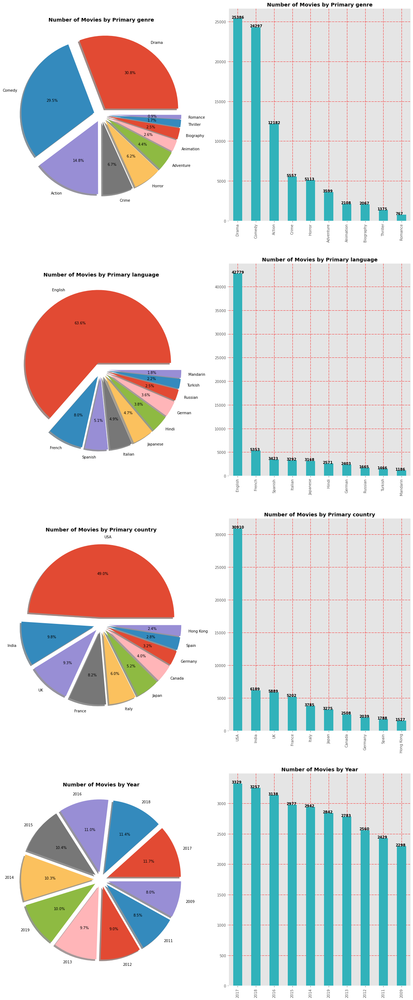

In [46]:
visualise_plot_plt()

In [69]:
def visualize_plotly():
    fig=make_subplots(rows=4,cols=2,
    specs=[[{"type":'xy'},{"type":'pie'}],[{"type":'xy'},{"type":'pie'}],[{"type":'xy'},{"type":'pie'}],[{"type":'xy'},{"type":'pie'}]],
    subplot_titles=['No.of Movies by Country','No.of Movies by Country','No.of Movies by Genre','No.of Movies by Genre','No.of Movies by Language','No.of Movies by Language','No.of Movies by Year','No.of Movies by Year'])

    fig.add_trace(go.Funnel(y=df.primary_country.value_counts()[:15].index,x=df.primary_country.value_counts()[:15].values),1,1)

    fig.add_trace(go.Pie(labels=df.primary_country.value_counts()[:15].index,values=df.primary_country.value_counts()[:15].values,hole=0.5),1,2)

    fig.add_trace(go.Funnel(y=df.primary_genre.value_counts()[:15].index,x=df.primary_genre.value_counts()[:15].values),2,1)

    fig.add_trace(go.Pie(labels=df.primary_genre.value_counts()[:15].index,values=df.primary_genre.value_counts()[:15].values,hole=0.5),2,2)

    fig.add_trace(go.Funnel(y=df.primary_language.value_counts()[:15].index,x=df.primary_language.value_counts()[:15].values),3,1)

    fig.add_trace(go.Pie(labels=df.primary_language.value_counts()[:15].index,values=df.primary_language.value_counts()[:15].values,hole=0.5),3,2)

    fig.add_trace(go.Funnel(y=df.year.value_counts()[:15].index,x=df.year.value_counts()[:15].values),4,1)

    fig.add_trace(go.Pie(labels=df.year.value_counts()[:15].index,values=df.year.value_counts()[:15].values,hole=0.5),4,2)


    fig.update_layout(width=1000,height=2000,showlegend=False)


    fig.show();
    
fig.savefig('output_plot.png')

In [70]:
visualize_plotly()

Text(0, 0.5, 'Total Votes')

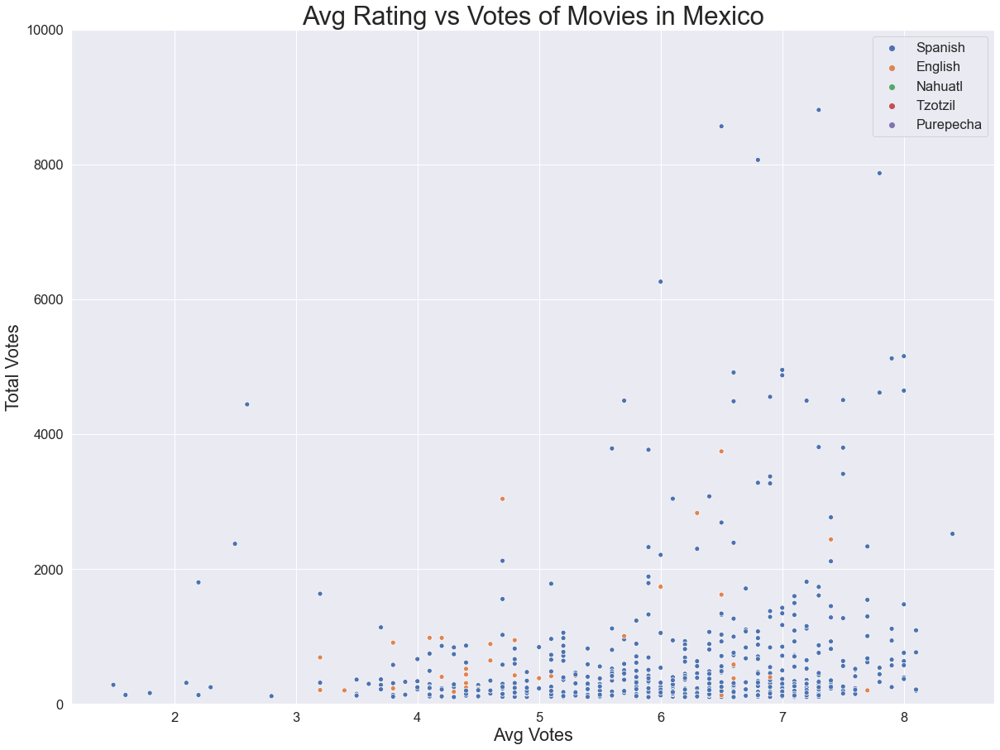

In [78]:
plt.figure(figsize=(20,15))
sns.set(font_scale=1.5)
sns.scatterplot(df[df.country=='Mexico'].avg_vote,df[df.country=='Mexico'].votes,hue=df[df.country=='Mexico'].primary_language.to_list())
plt.ylim(0,10000)
plt.legend(loc=1)
plt.title("Avg Rating vs Votes of Movies in Mexico",fontsize='xx-large')
plt.xlabel("Avg Votes",fontsize='large')
plt.ylabel("Total Votes",fontsize='large')

In [79]:
px.funnel(df[df.country=='Mexico'].primary_language.value_counts(),title="No of Movies by Language in Mexico")

In [82]:
px.histogram(data_frame=df,y='primary_country',color='primary_genre',height=800,width=900,title='No. of Movies in Each Language by Genre')

In [83]:
px.histogram(data_frame=df[df.country=='Mexico'],y='primary_language',color='primary_genre',height=768,width=900,title='No. of Movies in Each Language by Genre in Mexico')

In [84]:
px.sunburst(df.fillna('None'),path=['primary_country','primary_language','primary_genre'],
            height=700,width=700,title='No. of Movies in Each Language by Genre')

In [85]:
px.sunburst(df[df.country=='Mexico'].fillna('None'),path=['primary_language','primary_genre'],
            height=700,width=700,title='No. of Movies in Each Language by Genre in Mexico')

In [86]:
px.scatter_geo(locationmode='country names',locations=df['primary_country'].value_counts().index,size=df['primary_country'].value_counts(),
projection='kavrayskiy7',width=1000,color=df['primary_country'].value_counts().index)

In [87]:
# SELECTED NUMBER OF COUNTRIES
C=['USA','India','UK','France','Japan','Spain','Germany','Mexico']
px.scatter_polar(data_frame=df[df.primary_country.isin(C)],theta='primary_language',r='avg_vote',color='primary_genre',symbol='primary_genre',animation_frame='primary_country')

In [88]:
def get_recommendations_for(title,n=10):
    if (len(title.split())==1):
        title=title.capitalize()
    else:
        pass
    
    top=rat_trans.corrwith(rat_trans[title]).sort_values(ascending=False)[1:n+1]
    print('='*125)
    print('='*125)
    print(f" Name: {df[df.original_title==title]['original_title'].values[0]}")
    print(f" Cast: {df[df.original_title==title]['actors'].values[0]}")
    print(f" Language: {df[df.original_title==title]['language'].values[0]}")
    print(f" Genre: {df[df.original_title==title]['genre'].values[0]}")
    print(f" Year: {df[df.original_title==title]['year'].values[0]}")
    print(f" Description: {df[df.original_title==title]['description'].values[0]}")
    print('='*125)
    print('*'*125)
    
    for t in top.index:
        
        print('='*125)
        print('|' + ' '*123+'|')
        
        print(f"| Movie Name: {df[df.original_title==t]['original_title'].values[0]}")
        print(f"| Director: {df[df.original_title==t]['director'].values[0]}")
        print(f"| Cast: {df[df.original_title==t]['actors'].values[0]}")
        print(f"| Language: {df[df.original_title==t]['language'].values[0]}")
        print(f"| Genre: {df[df.original_title==t]['genre'].values[0]}")
        print(f"| Year: {df[df.original_title==t]['year'].values[0]}")
        print(f"| Country: {df[df.original_title==t]['country'].values[0]}")
        print(f"| Description: {df[df.original_title==t]['description'].values[0]}")
        print(f"| Rating: {df[df.original_title==t]['avg_vote'].values[0]}")
        print(f"| Total Votes: {df[df.original_title==t]['votes'].values[0]}")
    
        print('|' + ' '*123+'|')
        print('='*125)
        print('-'*125)
    
    plt.figure(figsize=(15,n))
    plt.tick_params()
    top.plot(kind='barh')
    plt.ylabel("Movie Name")
    plt.title("Correlation Score",fontsize='xx-large')
    for N,t in enumerate(top):
        plt.text(x=t+0.01,y=N-0.1,s=round(t,3)*100)

 Name: Wonder Woman
 Cast: Gal Gadot, Chris Pine, Connie Nielsen, Robin Wright, Danny Huston, David Thewlis, Saïd Taghmaoui, Ewen Bremner, Eugene Brave Rock, Lucy Davis, Elena Anaya, Lilly Aspell, Lisa Loven Kongsli, Ann Wolfe, Ann Ogbomo
 Language: English, German, Dutch, French, Spanish, Chinese, Greek, Ancient (to 1453), North American Indian
 Genre: Action, Adventure, Fantasy
 Year: 2017
 Description: When a pilot crashes and tells of conflict in the outside world, Diana, an Amazonian warrior in training, leaves home to fight a war, discovering her full powers and true destiny.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: Black Panther
| Director: Ryan Coogler
| Cast: Chadwick Boseman, Michael B. Jordan, Lupita Nyong'o, Danai Gurira, Martin Freeman, Daniel Kaluuya,

| Country: Netherlands, UK, Luxembourg, Germany
| Description: Claire lives with her wealthy adopted parents in a luxurious and isolated house in the woods. She discovers a wounded and bleeding boy her age in her family's garden shed. The boy is a ...
| Rating: 6.1
| Total Votes: 644
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: Deadpool 2
| Director: David Leitch
| Cast: Ryan Reynolds, Josh Brolin, Morena Baccarin, Julian Dennison, Zazie Beetz, T.J. Miller, Leslie Uggams, Karan Soni, Brianna Hildebrand, Jack Kesy, Eddie Marsan, Shioli Kutsuna, Stefan Kapicic, Randal Reeder, Nikolai Witschl
| Language: English, Cantonese, Spanish, Russian
| Genre

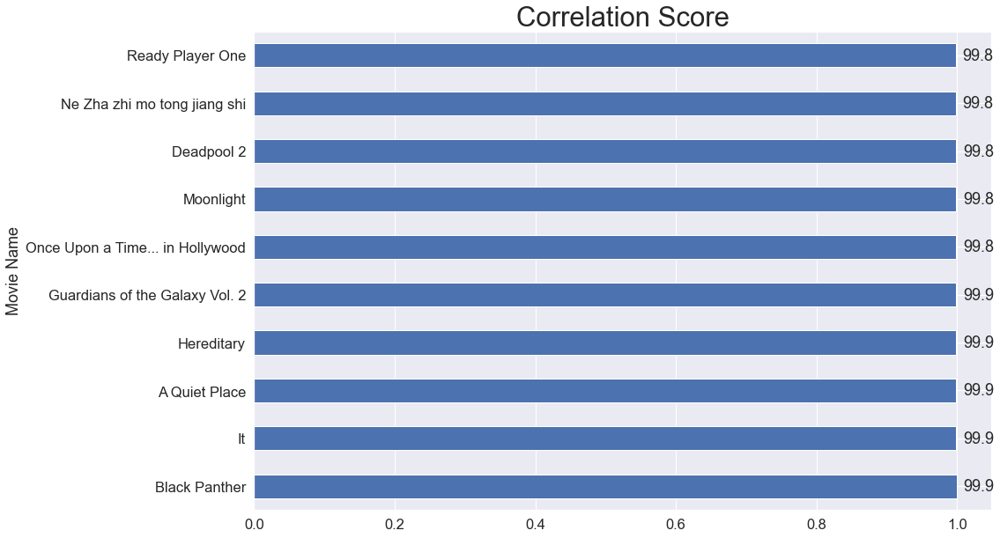

In [89]:
get_recommendations_for('Wonder Woman')

 Name: Nemo
 Cast: Seth Kibel, Jason Connery, Mathilda May, Nipsey Russell, Harvey Keitel, Carole Bouquet, Michel Blanc, Katrine Boorman, Dominique Pinon, Charley Boorman, Gaëtan Bloom, Pierre Forget, Marcus Powell, Carla D. Clark
 Language: English
 Genre: Adventure, Fantasy
 Year: 1984
 Description: A young boy imagines being in a tale he's about to hear. In this magical world he encounters many famous characters from other tales, aliens and other beings and, of course, a beautiful princess.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: Letti selvaggi
| Director: Luigi Zampa
| Cast: Ursula Andress, Laura Antonelli, Sylvia Kristel, Monica Vitti, Orazio Orlando, Michele Placido, José Sacristán, Roberto Benigni, Enrico Beruschi, José Luis López Vázquez, Gianfranco Barra,

| Total Votes: 242
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: Iron Maze
| Director: Hiroaki Yoshida
| Cast: Jeff Fahey, Bridget Fonda, Hiroaki Murakami, J.T. Walsh, John Randolph, Peter Allas, Gabriel Damon, Carmen Filpi, Francis John Thornton, Jeffrey Stephan, Mark Lowenthal, Goh Misawa, J. Michael Hunter, Lenora Nemetz, Steve Aronson
| Language: English
| Genre: Drama, Thriller
| Year: 1991
| Country: Japan, USA
| Description: In Corinth, a dying town 15 miles from Pittsburg: One evening, a Japanese businessman, who wanted to tear down the closed iron mills to build an amusement park, is found half dead in his ...
| Rating: 4.6
| Total Votes

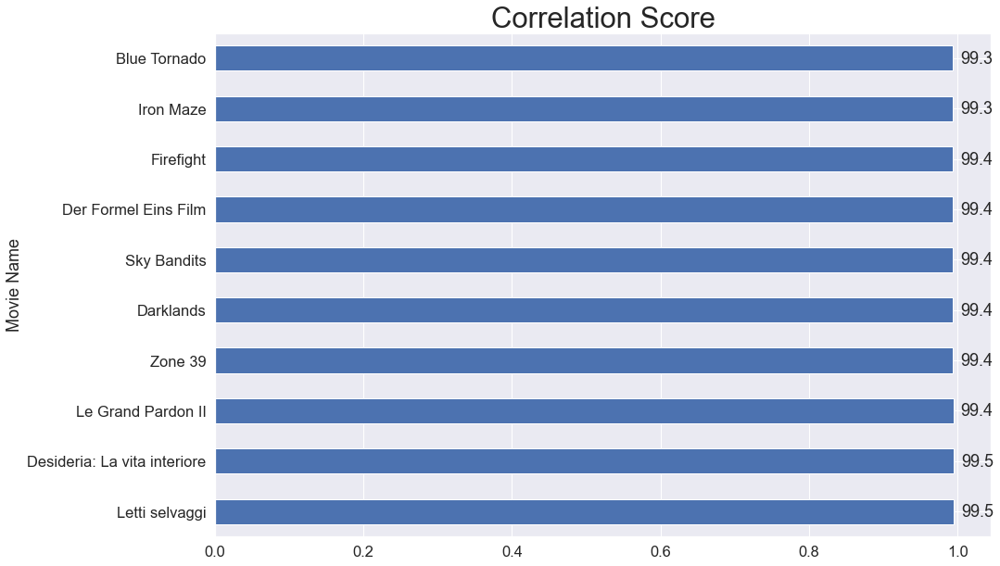

In [96]:
get_recommendations_for('Nemo')

In [97]:
get_recommendations_for('Cenicienta')

KeyError: 'Cenicienta'

 Name: The SpongeBob Movie: Sponge on the Run
 Cast: Tom Kenny, Bill Fagerbakke, Carolyn Lawrence, Rodger Bumpass, Mr. Lawrence, Matt Berry, Snoop Dogg, Keanu Reeves, Jill Talley, Antonio Raul Corbo, Veronica Alicino, Lori Alan, Awkwafina, Clancy Brown, Mary Jo Catlett
 Language: English
 Genre: Animation, Adventure, Comedy
 Year: 2020
 Description: After SpongeBob's beloved pet snail Gary is snail-napped, he and Patrick embark on an epic adventure to The Lost City of Atlantic City to bring Gary home.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: Chhappad Phaad Ke
| Director: Sameer Joshi
| Cast: Siddharth Menon, Vinay Pathak, Ayesha Raza, Anuj Sullere, Sheetal Thakur
| Language: Hindi
| Genre: Drama
| Year: 2019
| Country: India
| Description: Chappad Phaad Ke is a sat

| Cast: Tommie Grabiec, Ali Shadman, Callum Coates, Baharak Salehniya, Paul Dewdney, Jafar Dehghan, John O'Toole, Alirum Nouraei, Dariush Asadzade, Farrokh Nemati, Ahu Kheradmand, Iman Safa, Cameron Chapman, Bryan Torfeh, Mohammad Javad Bonakdar
| Language: Persian, English, Russian
| Genre: Action, Biography, Drama
| Year: 2016
| Country: Iran
| Description: The story of courage and sacrifice of Iranians in the time of war and famine.
| Rating: 6.0
| Total Votes: 278
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: Jessie
| Director: Aswani Kumar V.
| Cast: Ashima Narwal, Sritha Chandana, Atul Kulkarni, Kabir Duhan Singh, Archana Shastry, Pavani Ga

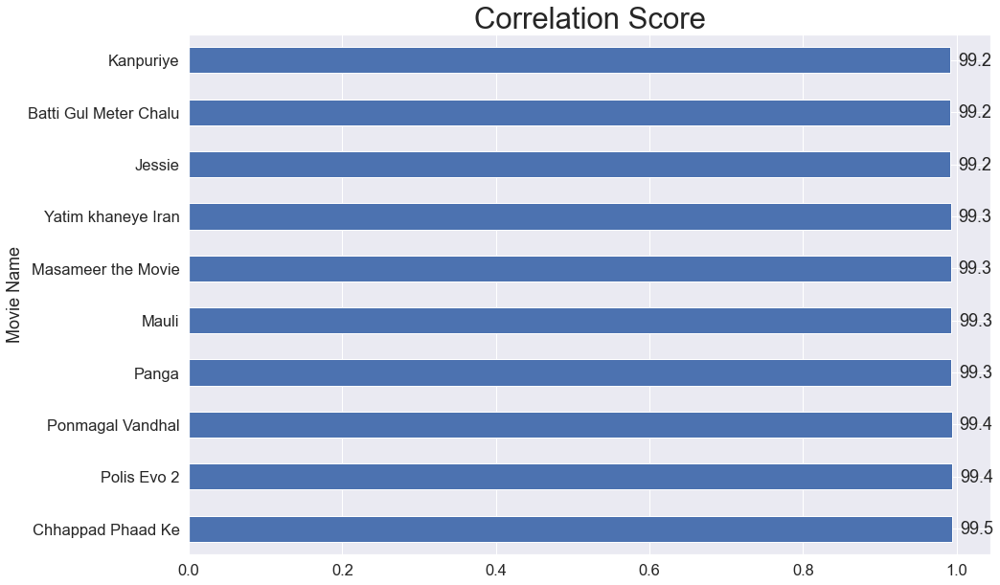

In [98]:
get_recommendations_for('The SpongeBob Movie: Sponge on the Run')

 Name: Hereditary
 Cast: Alex Wolff, Gabriel Byrne, Toni Collette, Milly Shapiro, Christy Summerhays, Morgan Lund, Mallory Bechtel, Jake Brown, Harrison Nell, BriAnn Rachele, Heidi Méndez, Moises L. Tovar, Jarrod Phillips, Ann Dowd, Brock McKinney
 Language: English, Spanish
 Genre: Drama, Horror, Mystery
 Year: 2018
 Description: A grieving family is haunted by tragic and disturbing occurrences.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: Moonlight
| Director: Paula van der Oest
| Cast: Hunter Bussemaker, Franck Sasonoff, Andrew Howard, David Bustard, Elvir Sabanovic, Laurien Van den Broeck, Johan Leysen, Stephen Tate, Quick, Jemma Redgrave, Sarah Markianidis, Emma Drews, Valerie Scott, Aurélie Petrini, Janine Horsburgh
| Language: English, French
| Genre: Thriller
|

| Country: USA, UK
| Description: Set in 1950s London, Reynolds Woodcock is a renowned dressmaker whose fastidious life is disrupted by a young, strong-willed woman, Alma, who becomes his muse and lover.
| Rating: 7.5
| Total Votes: 106231
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: Once Upon a Time... in Hollywood
| Director: Quentin Tarantino
| Cast: Leonardo DiCaprio, Brad Pitt, Margot Robbie, Emile Hirsch, Margaret Qualley, Timothy Olyphant, Julia Butters, Austin Butler, Dakota Fanning, Bruce Dern, Mike Moh, Luke Perry, Damian Lewis, Al Pacino, Nicholas Hammond
| Language: English, Italian, Spanish, German
| Genre: Comedy, Drama
| Year: 201

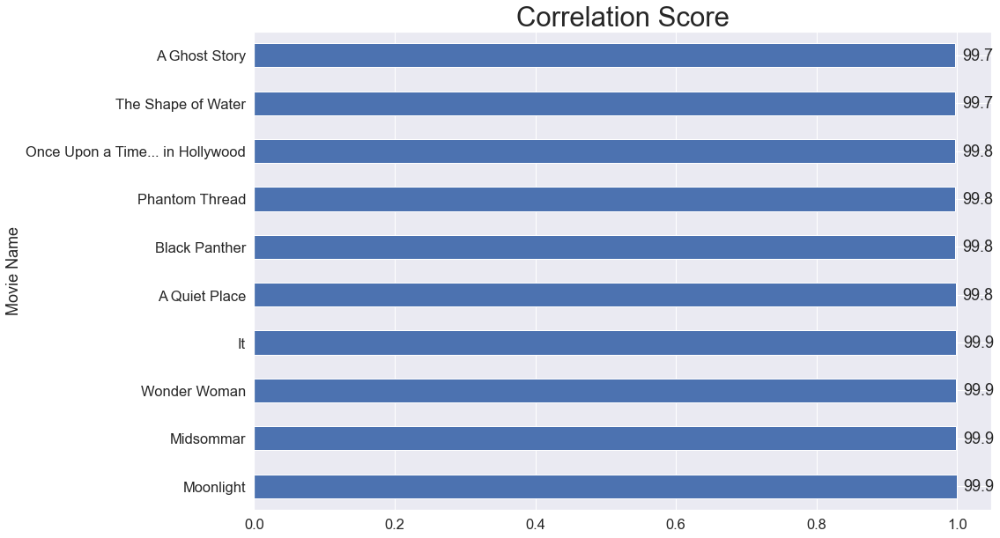

In [100]:
get_recommendations_for('Hereditary')

 Name: A Quiet Place
 Cast: Emily Blunt, John Krasinski, Millicent Simmonds, Noah Jupe, Cade Woodward, Leon Russom
 Language: English, American Sign Language
 Genre: Drama, Horror, Sci-Fi
 Year: 2018
 Description: In a post-apocalyptic world, a family is forced to live in silence while hiding from monsters with ultra-sensitive hearing.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: Guardians of the Galaxy Vol. 2
| Director: James Gunn
| Cast: Chris Pratt, Zoe Saldana, Dave Bautista, Vin Diesel, Bradley Cooper, Michael Rooker, Karen Gillan, Pom Klementieff, Sylvester Stallone, Kurt Russell, Elizabeth Debicki, Chris Sullivan, Sean Gunn, Tommy Flanagan, Laura Haddock
| Language: English
| Genre: Action, Adventure, Comedy
| Year: 2017
| Country: USA
| Description: The Guardi

| Rating: 7.6
| Total Votes: 507214
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: Baby Driver
| Director: Edgar Wright
| Cast: Ansel Elgort, Jon Bernthal, Jon Hamm, Eiza González, Micah Howard, Lily James, Morgan Brown, Kevin Spacey, Morse Diggs, CJ Jones, Sky Ferreira, Lance Palmer, Hudson Meek, Viviana Chavez, Hal Whiteside
| Language: English, American Sign Language
| Genre: Action, Crime, Drama
| Year: 2017
| Country: UK, USA
| Description: After being coerced into working for a crime boss, a young getaway driver finds himself taking part in a heist doomed to fail.
| Rating: 7.6
| Total Votes: 422594
|                                         

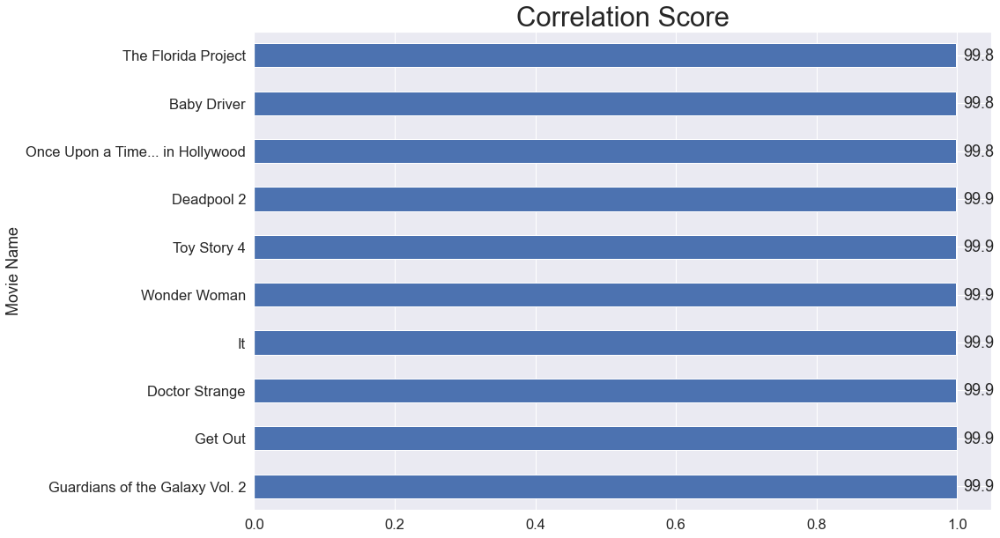

In [101]:
get_recommendations_for('A Quiet Place')

 Name: Beverly Hills Chihuahua
 Cast: Piper Perabo, Manolo Cardona, Jamie Lee Curtis, José María Yazpik, Maury Sterling, Jesús Ochoa, Eugenio Derbez, Omar Leyva, Naomy Romo, Ali Hillis, Marguerite Moreau, Nick Zano, Carmen Vera, Gina Gallego, Hiram Vilchez
 Language: English
 Genre: Adventure, Comedy, Drama
 Year: 2008
 Description: While on vacation in Mexico, Chloe, a ritzy Beverly Hills chihuahua, finds herself lost and in need of assistance in order to get back home.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: Best Night Ever
| Director: Jason Friedberg, Aaron Seltzer
| Cast: Desiree Hall, Eddie Ritchard, Samantha Colburn, Crista Flanagan, Andy Favreau, Nick Steele, Lynette DuPree, Jason Beaubien, Amin Joseph, James Jordan, Winston James Francis, Patrick Quinlan, 

| Description: Seeking to offer his son the satisfying summer camp experience that eluded him as a child, the operator of a neighborhood daycare center opens his own camp, only to face financial hardship and stiff competition from a rival camp.
| Rating: 3.1
| Total Votes: 15427
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: Greystone Park
| Director: Sean Stone
| Cast: Sean Stone, Alexander Wraith, Ella Lentini, John Schramm, Monique Zordan, Oliver Stone, Monique van Vooren, Jessica Lentini, Michael Stone, Bruce Payne, Pete Antico, Coralie Charriol Paul, Lauren Berlingeri, Zana Markelson, Nicole Seidel
| Language: English
| Genre: Horror, Thrille

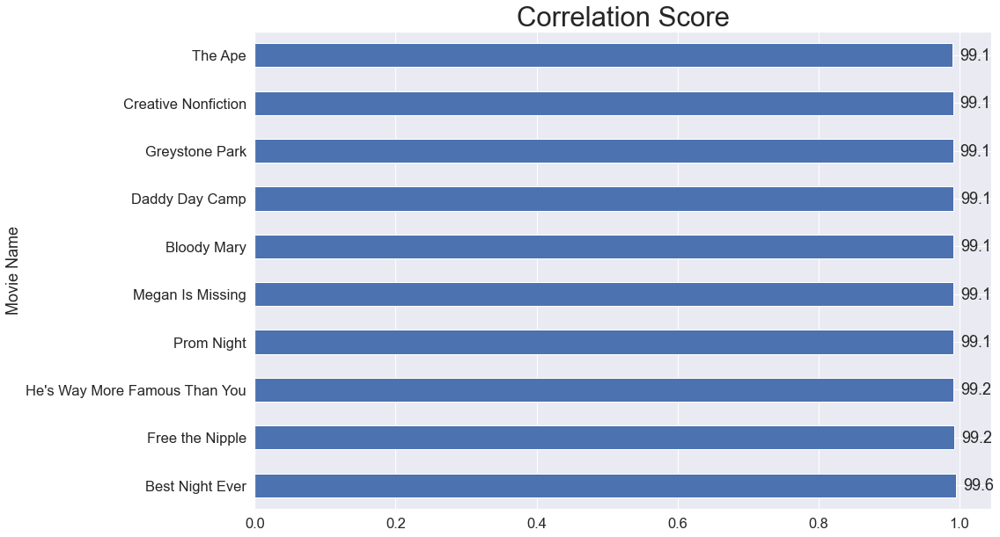

In [102]:
get_recommendations_for('Beverly Hills Chihuahua')

 Name: Transformers
 Cast: Shia LaBeouf, Megan Fox, Josh Duhamel, Tyrese Gibson, Rachael Taylor, Anthony Anderson, Jon Voight, John Turturro, Michael O'Neill, Kevin Dunn, Julie White, Amaury Nolasco, Zack Ward, Luis Echagarruga, Patrick Mulderrig
 Language: English, Spanish
 Genre: Action, Adventure, Sci-Fi
 Year: 2007
 Description: An ancient struggle between two Cybertronian races, the heroic Autobots and the evil Decepticons, comes to Earth, with a clue to the ultimate power held by a teenager.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: Dumb and Dumber
| Director: Peter Farrelly, Bobby Farrelly
| Cast: Jim Carrey, Jeff Daniels, Lauren Holly, Mike Starr, Karen Duffy, Charles Rocket, Victoria Rowell, Joe Baker, Hank Brandt, Teri Garr, Brady Bluhm, Cam Neely, Felton 

| Movie Name: Cloverfield
| Director: Matt Reeves
| Cast: Lizzy Caplan, Jessica Lucas, T.J. Miller, Michael Stahl-David, Mike Vogel, Odette Annable, Anjul Nigam, Margot Farley, Theo Rossi, Brian Klugman, Kelvin Yu, Liza Lapira, Lili Mirojnick, Ben Feldman, Elena Nikitina Bick
| Language: English, Russian
| Genre: Action, Adventure, Horror
| Year: 2008
| Country: USA
| Description: A group of friends venture deep into the streets of New York on a rescue mission during a rampaging monster attack.
| Rating: 7.0
| Total Votes: 367611
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: The Matrix Reloaded
| Director: Lana Wachowski, Lilly Wachowski
| Cast: 

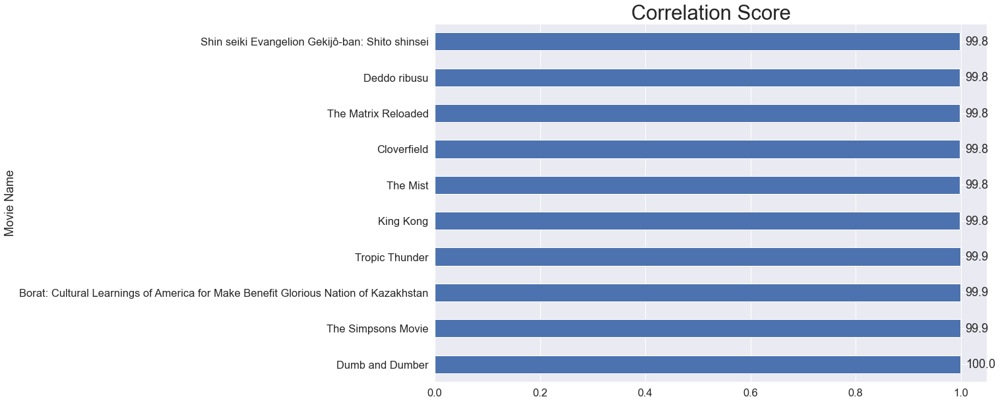

In [103]:
get_recommendations_for('Transformers')

 Name: Home on the Range
 Cast: G.W. Bailey, Roseanne Barr, Bobby Block, Steve Buscemi, Carole Cook, Charlie Dell, Judi Dench, Charles Dennis, Marshall Efron, Joe Flaherty, Cuba Gooding Jr., Charles Haid, Estelle Harris, Lance LeGault, Sam Levine
 Language: English, Mandarin
 Genre: Animation, Adventure, Comedy
 Year: 2004
 Description: To save their farm, the resident animals go bounty hunting for a notorious outlaw.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: The Jungle Book 2
| Director: Steve Trenbirth
| Cast: John Goodman, Haley Joel Osment, Mae Whitman, Connor Funk, Bob Joles, Tony Jay, John Rhys-Davies, Jim Cummings, Phil Collins, Jeff Bennett, Veena Bidasha, Brian Cummings, Baron Davis, Bobby Edner, Jess Harnell
| Language: English
| Genre: Animation, Adventur

| Cast: Zach Braff, Garry Marshall, Don Knotts, Patrick Stewart, Amy Sedaris, Steve Zahn, Joan Cusack, Wallace Shawn, Harry Shearer, Fred Willard, Catherine O'Hara, Patrick Warburton, Adam West, Mark Walton, Mark Dindal
| Language: English
| Genre: Animation, Adventure, Comedy
| Year: 2005
| Country: USA
| Description: After ruining his reputation with the town, a courageous chicken must come to the rescue of his fellow citizens when aliens start an invasion.
| Rating: 5.7
| Total Votes: 84176
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: Alvin and the Chipmunks
| Director: Tim Hill
| Cast: Jason Lee, David Cross, Cameron Richardson, Jane Lynch, 

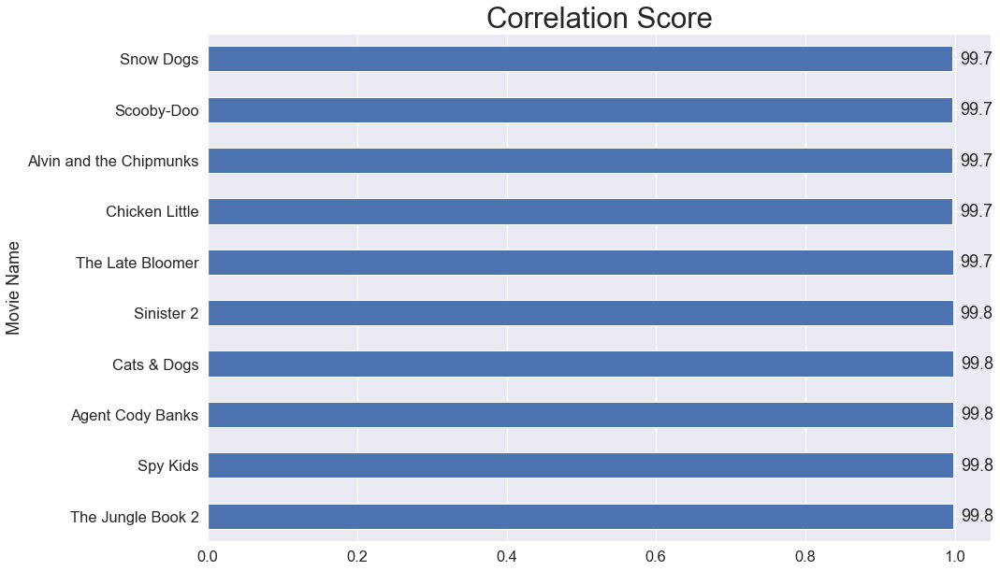

In [104]:
get_recommendations_for('Home on the Range')

 Name: Transformers: Revenge of the Fallen
 Cast: Shia LaBeouf, Megan Fox, Josh Duhamel, Tyrese Gibson, John Turturro, Ramon Rodriguez, Kevin Dunn, Julie White, Isabel Lucas, John Benjamin Hickey, Matthew Marsden, Andrew Howard, Michael Papajohn, Glenn Morshower, John Eric Bentley
 Language: English, Spanish
 Genre: Action, Adventure, Sci-Fi
 Year: 2009
 Description: Sam Witwicky leaves the Autobots behind for a normal life. But when his mind is filled with cryptic symbols, the Decepticons target him and he is dragged back into the Transformers' war.
*****************************************************************************************************************************
|                                                                                                                           |
| Movie Name: Transformers: Dark of the Moon
| Director: Michael Bay
| Cast: Shia LaBeouf, Rosie Huntington-Whiteley, Josh Duhamel, John Turturro, Tyrese Gibson, Patrick Dempsey, Frances McDo

| Cast: Tobin Bell, Costas Mandylor, Scott Patterson, Betsy Russell, Lyriq Bent, Athena Karkanis, Louis Ferreira, Simon Reynolds, Donnie Wahlberg, Angus Macfadyen, Shawnee Smith, Bahar Soomekh, Dina Meyer, Mike Realba, Marty Adams
| Language: English
| Genre: Horror, Mystery, Thriller
| Year: 2007
| Country: Canada, USA
| Description: Despite Jigsaw's death, and in order to save the lives of two of his colleagues, Lieutenant Rigg is forced to take part in a new game, which promises to test him to the limit.
| Rating: 5.9
| Total Votes: 137921
|                                                                                                                           |
-----------------------------------------------------------------------------------------------------------------------------
|                                                                                                                           |
| Movie Name: Rush Hour 3
| Director: Brett Ratner
| Cast: Chris Tucker, 

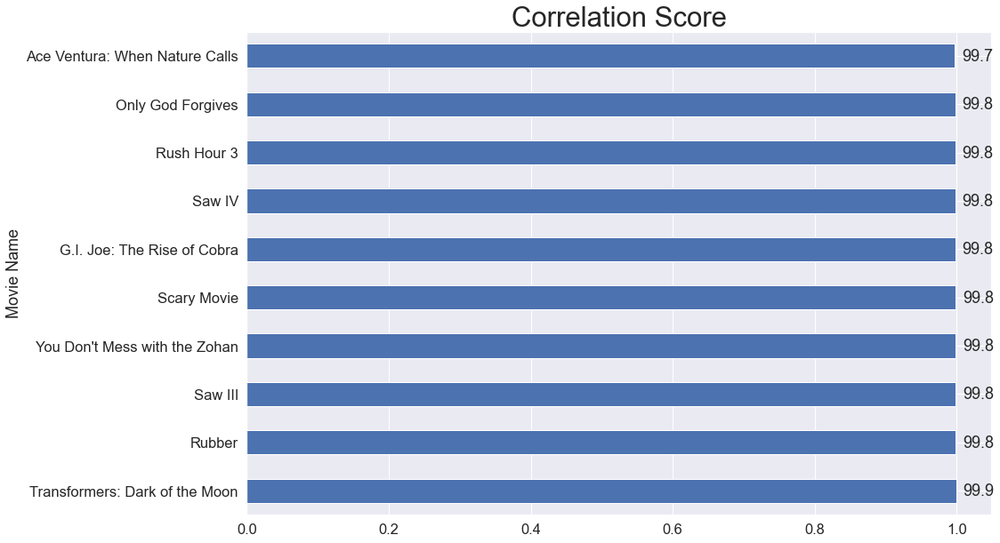

In [105]:
get_recommendations_for('Transformers: Revenge of the Fallen')

In [106]:
get_recommendations_for('Take the ball pass the ball')

KeyError: 'Take the ball pass the ball'